**Environment setup**

In [1]:
import numpy as np
from google.colab import drive
from matplotlib.lines import Line2D
from copy import deepcopy
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import pandas as pd

In [4]:
drive.mount('/content/drive')

Mounted at /content/drive


**Necessary parameter setup**

In [2]:
max_warmup = 1000
warmup_window = 100

window_array = np.append(np.repeat(10, 10),
                      np.repeat(warmup_window, max_warmup // warmup_window - 1))

warmup_length = np.repeat(10, len(window_array))
for i in range(len(warmup_length) - 1):
    warmup_length[i + 1] = warmup_length[i] + window_array[i + 1]

# Transition kernel for short regime
repitition = 10
num_chains_short = 2048
num_super_chains = 16

In [3]:
# quantiles for chi squared with df = 1
chi_up = 3.841459 # 95th quantile for chi squared with df = 1
chi_lo = 0.00393214  # 05th quantile for chi squared with df = 1
tau = 1e-4
M = num_chains_short // num_super_chains
nRhat_lower = np.sqrt(1 + 1 / M + tau)
eps_lower = nRhat_lower - 1
bound = [chi_lo / num_chains_short, chi_up / num_chains_short]
threshold = eps_lower

In [5]:
############################################
# Replication Plotting Functions
############################################
# Line Plots
def MSE_vs_Warmup(W_c_df, W_n_df,title):
    fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
    common = dict(
        logx=True,
        logy=True,
        legend=False,
        ax=ax,
        ylabel="Mean Sqaured Error",
        x="Warmup Length")
    ax = W_c_df.plot(
        y="Avg MSE",
        title=title,
        linestyle="-",
        color="orange",
        **common)
    W_c_df.plot(
        y="Best MSE",
        linestyle="--",
        color="orange",
        **common)
    W_c_df.plot(
        y="Worst MSE",
        linestyle="--",
        color="orange",
        **common)
    W_n_df.plot(
        y="Avg MSE",
        linestyle="-",
        color="black",
        **common)
    W_n_df.plot(
        y="Worst MSE",
        linestyle="--",
        color="black",
        **common)
    W_n_df.plot(
        y="Best MSE",
        linestyle="--",
        color="black",
        **common)
    ax.set_title(title, fontsize=18, fontweight="bold", pad=12)
    ax.legend(handles=[
        Line2D([0], [0], color="orange", lw=2, label="Constrained"),
        Line2D([0], [0], color="black", lw=2, label="Naive")])

# Scatter Plots
def MSE_vs_Rhat(df, title, naive, bound, threshold, num_subchains):
    fig, ax = plt.subplots(figsize=(10, 8), dpi=150)

    ax.scatter(
        df["Rhat"] - 1,
        df["MSE"],
        color="blue",
        s=35,
        alpha=0.4,
    )

    ax.set_yscale("log")

    if not naive:
        ax.set_xscale("log")

    ax.axhline(bound[0], color="black", linestyle="--")
    ax.axhline(bound[1], color="black", linestyle="--")
    ax.axhline(1 / num_subchains, color="black")
    ax.axvline(threshold, color="blue", linestyle="--")

    ax.set_xlabel(r"$\widehat{R}_{\nu}-1$")
    ax.set_ylabel("Scaled squared error")

    suffix = "Constrained" if not naive else "Naive"
    ax.set_title(f"{title} - {suffix}", fontsize=20, fontweight="bold")

    plt.tight_layout()
    plt.show()

############################################
# Enhanced Plotting Functions
############################################
def MSE_vs_Warmup_Jumbo(tfp_c_df, tfp_n_df,
                        bjx_c_df, bjx_n_df,
                        pf_df, title):
    fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
    colors = {
           "TFP":"orange",
           "BlackJAX":"black",
           "PathFinder":"blue"}
    linestyles = {
           "Constrained":"-",
           "Naive":"--"}
    common = dict(
           logx=True,
           logy=True,
           legend=False,
           ax=ax,
           x="Warmup Length")
    def plot_with_band(df, color, linestyle, label, hatch):
           ax.plot(
               df["Warmup Length"],
               df["Avg MSE"],
               color = color,
               linestyle = linestyle,
               linewidth = 2,
               label = label)
           ax.fill_between(
               df["Warmup Length"],
               df["Best MSE"],
               df["Worst MSE"],
               color = color,
               alpha = 0.20,
               hatch = hatch)
    # TFP implementation:
    plot_with_band(
        tfp_c_df,
        colors["TFP"],
        linestyles["Constrained"],
        "TFP-Constrained",
        hatch = None)
    plot_with_band(
        tfp_n_df,
        colors["TFP"],
        linestyles["Naive"],
        "TFP-Naive",
        hatch = "oo")
    # BlackJAX implementation
    plot_with_band(
        bjx_c_df,
        colors["BlackJAX"],
        linestyles["Constrained"],
        "BlackJAX-Constrained",
        hatch = None)
    plot_with_band(
        bjx_n_df,
        colors["BlackJAX"],
        linestyles["Naive"],
        "BlackJAX-Naive",
        hatch = "xxx")
    plot_with_band(
        pf_df,
        colors["PathFinder"],
        '-',
        "PathFinder Initialization",
        hatch = None)
    ax.set_title(title, fontsize=20, fontweight="bold")
    ax.set_ylabel("Mean Squared Error")
    ax.set_xlabel("Warmup Length")
    ax.set_xscale("log")
    ax.set_yscale("log")

    ax.legend()
    plt.show()

# Color Coded Scatter Plots
def MSE_vs_Rhat_color(dfs, titles, supertitle, bound,
                      threshold,num_subchains, color_choice):
     fig, axes = plt.subplots(2,3, figsize=(25,10),dpi=150,
                              sharex=True, sharey = True)
     axes = axes.flatten()
     if color_choice == "Dimension":
         vmin = min(df["Dimension"].min() for df in dfs)
         vmax = max(df["Dimension"].max() for df in dfs)

         for ax, df, panel_title in zip(axes, dfs, titles):
               sc = ax.scatter(
                    df["Rhat"] - 1,
                    df["MSE"],
                    c = df["Dimension"],
                    cmap = "viridis",
                    vmin = vmin,
                    vmax = vmax,
                    s=35,
                    alpha = 0.5
               )

               ax.set_title(panel_title)
         cbar = fig.colorbar(sc, ax = axes, shrink=0.8)
         cbar.set_label("Dimension")

         if vmax - vmin <= 20:
               tick_values = np.arange(vmin, vmax +1)
         else:
               tick_values = np.linspace(vmin , vmax, 5). round().astype(int)
         cbar.set_ticks(tick_values)

     elif color_choice== "Warmup Length":
          warmups = np.sort(
               np.unique(np.concatenate(
                    [df["Warmup Length"].unique() for df in dfs]
               ))
          )
          cmap = plt.get_cmap("RdYlBu_r")
          color_map = {
               w:cmap(x)
               for w, x in zip(warmups, np.linspace(0,1,len(warmups)))
          }

          for ax, df, panel_title in zip(axes, dfs, titles):
               groups = df.groupby("Warmup Length")

               for warmup, subset in groups:
                    ax.scatter(
                         subset["Rhat"] -1,
                         subset["MSE"],
                         color = color_map[warmup],
                         s=35,
                         alpha=0.5)
               ax.set_title(panel_title)
          handles = [Line2D(
               [0],[0],marker="o", color = color_map[warmup],
               linestyle = "", markersize = 7, label=str(warmup)) for warmup in warmups]
          fig.legend(
               handles = handles,
               title = "Warmup Length",
               loc = "center right",
               bbox_to_anchor = (1.02, 0.5),
               ncol = 1,
               fontsize = 9,
          )
     else:
          raise ValueError("color_choice must be either \"Dimension\" or \"Warmup Length\"!")
     for ax in axes:
          ax.set_yscale("log")
          ax.set_xscale("log")

          ax.axhline(
               bound[0], color="black",linestyle="--"
          )

          ax.axhline(
               bound[1], color="black",linestyle="--"
          )

          ax.axhline(
            1 / num_subchains,color="black"
            )
          ax.axvline(
            threshold, color="blue",linestyle="--"
            )

          ax.set_xlabel(r"$\widehat{R}_{\nu}-1$")

          ax.tick_params(
               axis="both",
               which = "both",
               labelbottom = True,
               labelleft = True
          )
     axes[0].set_ylabel("Scaled Squared Error")

     fig.suptitle(supertitle, fontsize=20, fontweight="bold")
     plt.show()

In [ ]:
utility_link = '/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/Report_files/PlotUtil.py'
with open(utility_link) as f: exec(f.read())

**Rosenbrock Example**

In [6]:
##########################
# TFP implementation:
##########################
# MSE vs Warmups:
tfp_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Rosen_MSE_constrained.pkl"
tfp_MSE_c_df = pd.read_pickle(tfp_MSE_c_path)

tfp_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Rosen_MSE_naive.pkl"
tfp_MSE_n_df = pd.read_pickle(tfp_MSE_n_path)
# MSE vs nested Rhat:
tfp_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Rosen_R_Hat_constrained.pkl"
tfp_R_Hat_c_df = pd.read_pickle(tfp_R_hat_c_path)

tfp_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Rosen_R_Hat_naive.pkl"
tfp_R_Hat_n_df = pd.read_pickle(tfp_R_hat_n_path)
print("TFP implementation data Loaded!")
##########################
# BlackJAX implementation:
##########################
# MSE vs Warmups:
bjx_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Rosen_MSE_constrained.pkl"
bjx_MSE_c_df = pd.read_pickle(bjx_MSE_c_path)

bjx_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Rosen_MSE_naive.pkl"
bjx_MSE_n_df = pd.read_pickle(bjx_MSE_n_path)
# MSE vs nested Rhat:
bjx_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Rosen_R_Hat_constrained.pkl"
bjx_R_Hat_c_df = pd.read_pickle(bjx_R_hat_c_path)

bjx_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Rosen_R_Hat_naive.pkl"
bjx_R_Hat_n_df = pd.read_pickle(bjx_R_hat_n_path)
print("BlackJAX implementation data Loaded!")
##########################
# BlackJAX implementation, with PathFinder Initialization:
##########################
# MSE vs Warmups:
pf_MSE_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/Rosen_MSE.pkl"
pf_MSE_df = pd.read_pickle(pf_MSE_path)
# MSE vs nested Rhat:
pf_R_Hat_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/Rosen_R_Hat.pkl"
pf_R_Hat_df = pd.read_pickle(pf_R_Hat_path)
print("PathFinder implementation data Loaded!")

TFP implementation data Loaded!
BlackJAX implementation data Loaded!
PathFinder implementation data Loaded!


*Original Paper: line plot*

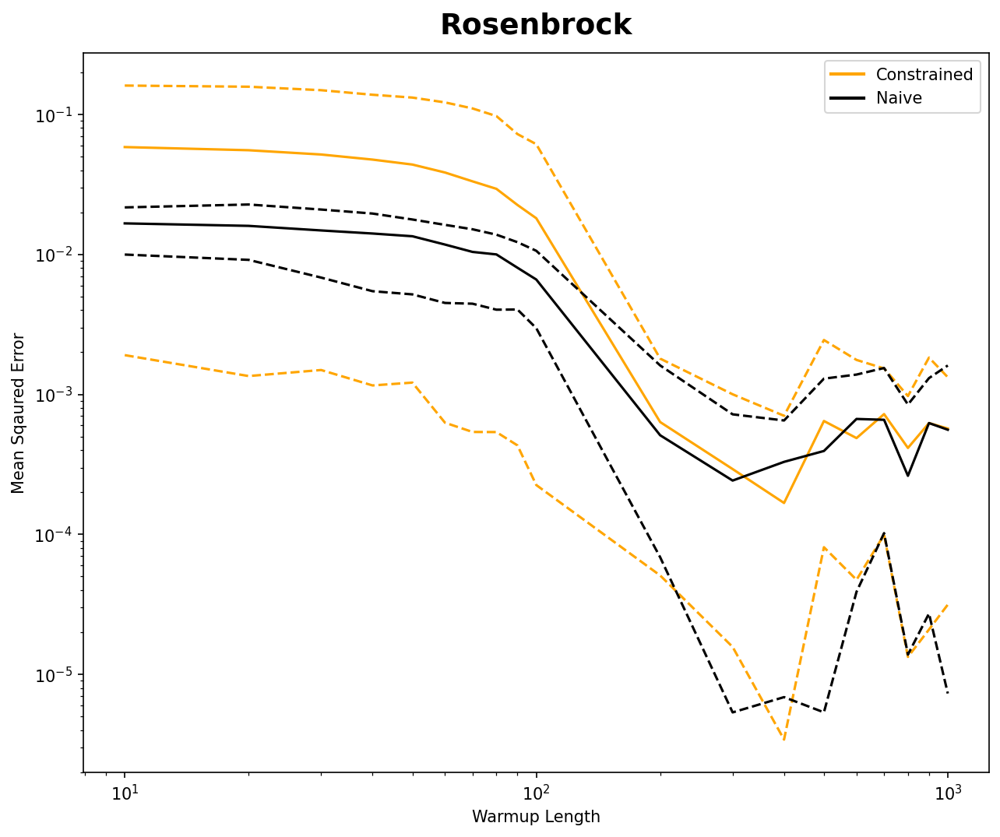

In [7]:
MSE_vs_Warmup(tfp_MSE_c_df, tfp_MSE_n_df, "Rosenbrock")

*Original Paper: Scatter plot*

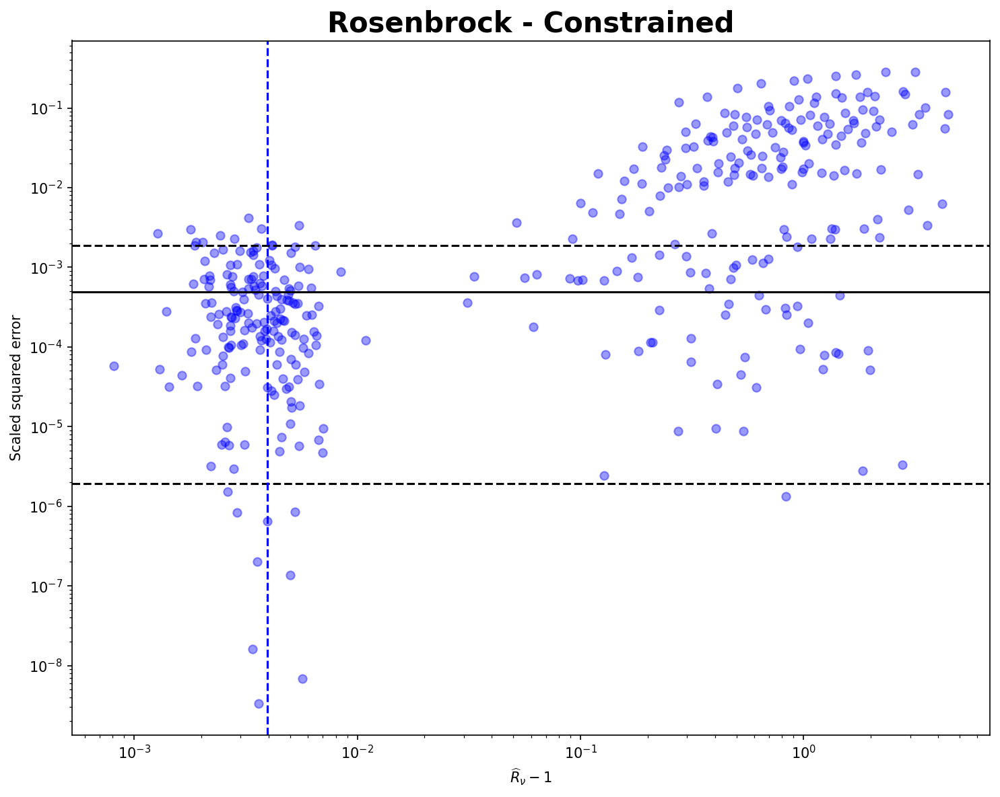

In [8]:
MSE_vs_Rhat(tfp_R_Hat_c_df, "Rosenbrock", False, bound, threshold,num_chains_short)

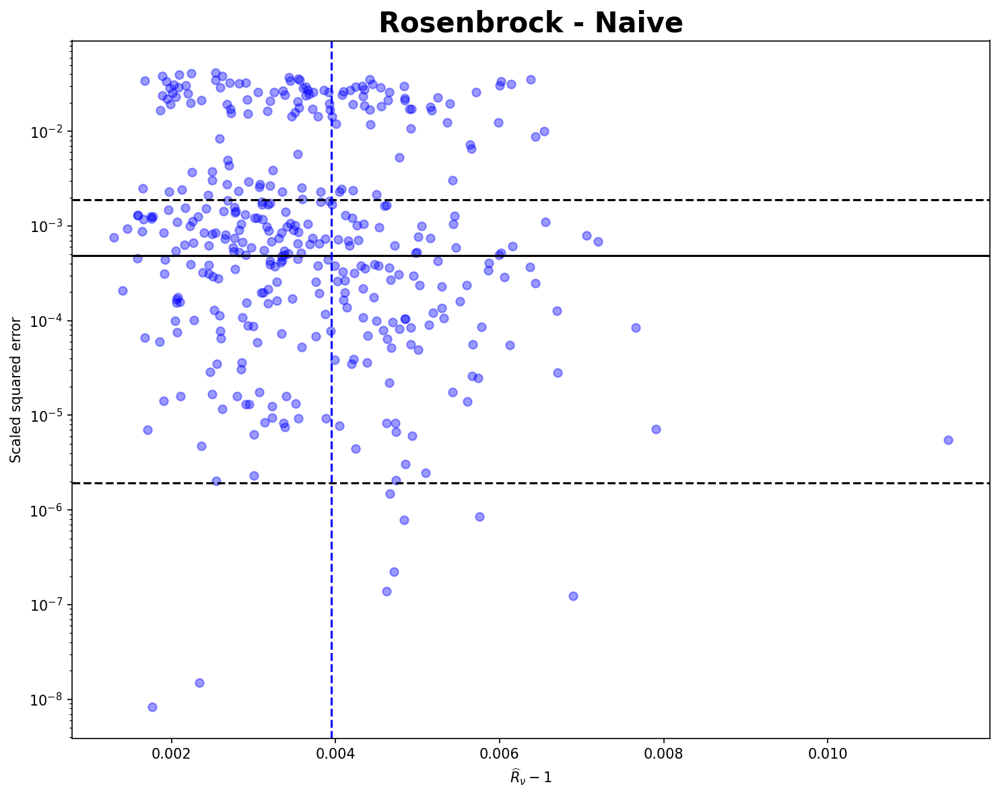

In [9]:
MSE_vs_Rhat(tfp_R_Hat_n_df, "Rosenbrock", True, bound, threshold,num_chains_short)

*Enhanced Plots: multiple line plots*

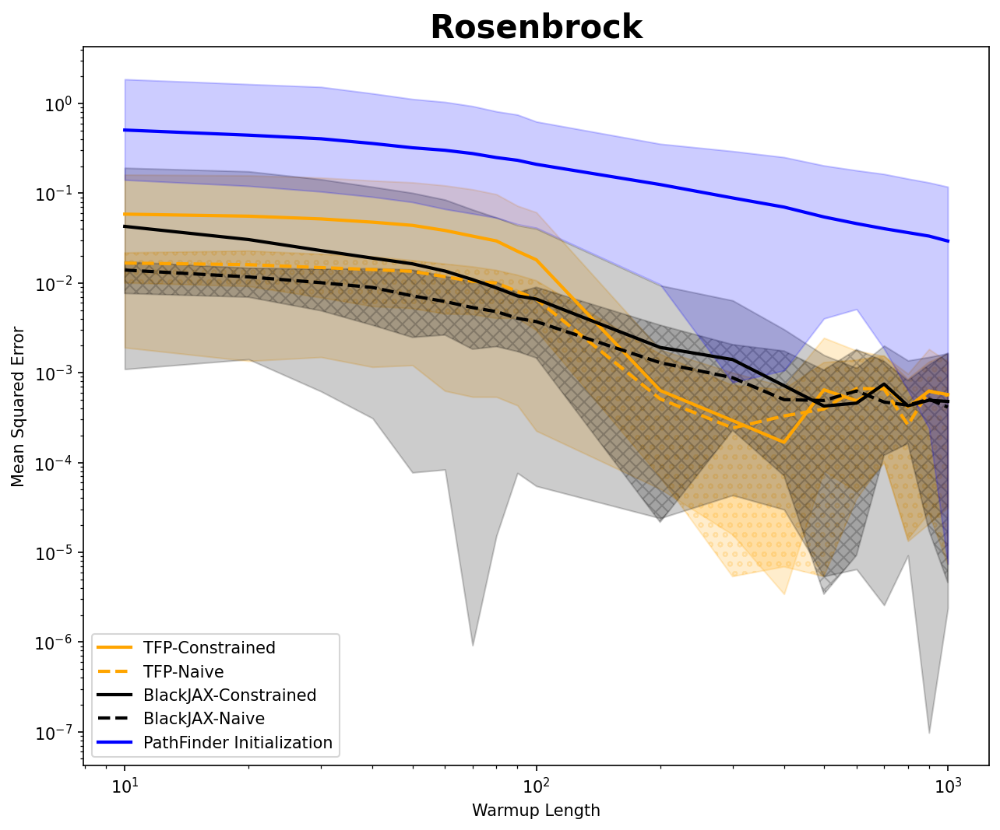

In [10]:
MSE_vs_Warmup_Jumbo(tfp_MSE_c_df, tfp_MSE_n_df,
                    bjx_MSE_c_df, bjx_MSE_n_df,
                    pf_MSE_df, "Rosenbrock")

*Enhanced Plots: colored Scatter Plots*

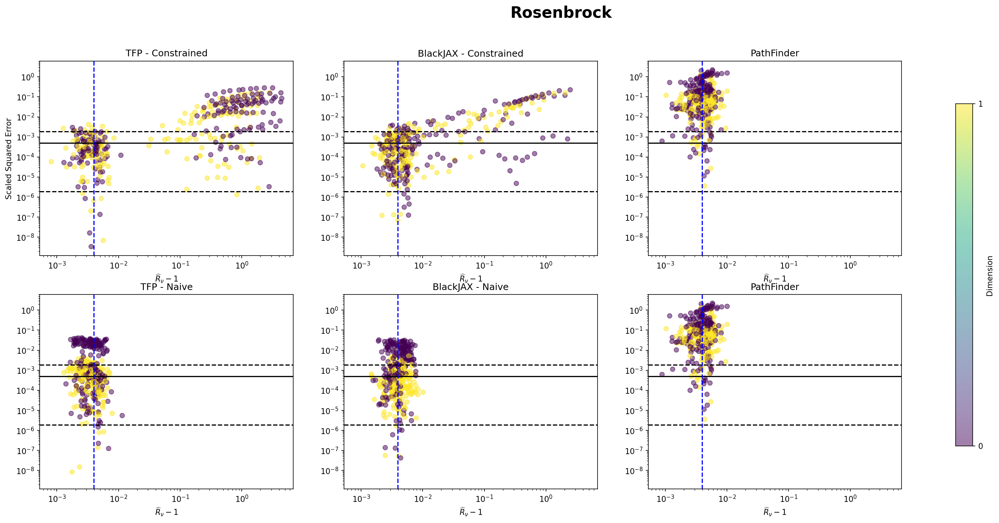

In [11]:
dfs=[tfp_R_Hat_c_df, bjx_R_Hat_c_df, pf_R_Hat_df,
     tfp_R_Hat_n_df, bjx_R_Hat_n_df, pf_R_Hat_df]

titles =["TFP - Constrained","BlackJAX - Constrained","PathFinder",
         "TFP - Naive","BlackJAX - Naive","PathFinder"]
MSE_vs_Rhat_color(dfs, titles,"Rosenbrock",bound, threshold,num_chains_short,"Dimension")

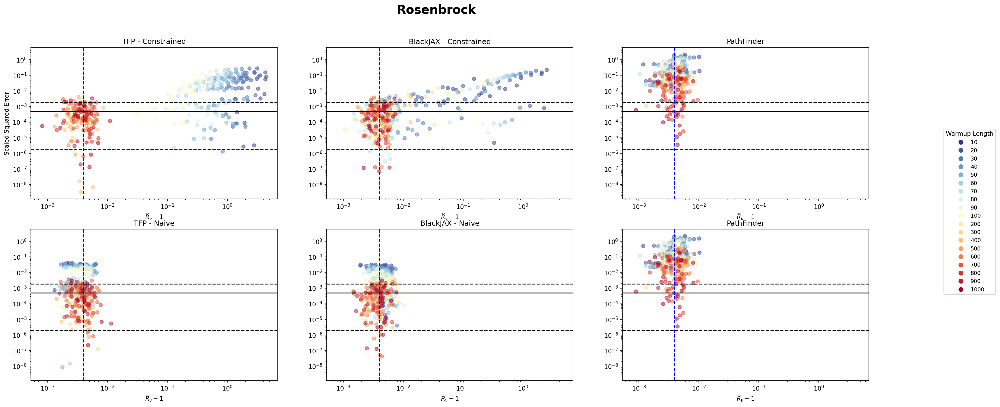

In [12]:
MSE_vs_Rhat_color(dfs, titles,"Rosenbrock",bound, threshold,
                  num_chains_short,"Warmup Length")

**Bimodal Example**

In [13]:
##########################
# TFP implementation:
##########################
# MSE vs Warmups:
tfp_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Bimodal_MSE_constrained.pkl"
tfp_MSE_c_df = pd.read_pickle(tfp_MSE_c_path)

tfp_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Bimodal_MSE_naive.pkl"
tfp_MSE_n_df = pd.read_pickle(tfp_MSE_n_path)
# MSE vs nested Rhat:
tfp_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Bimodal_R_Hat_constrained.pkl"
tfp_R_Hat_c_df = pd.read_pickle(tfp_R_hat_c_path)

tfp_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/Bimodal_R_Hat_naive.pkl"
tfp_R_Hat_n_df = pd.read_pickle(tfp_R_hat_n_path)
print("TFP implementation data Loaded!")
##########################
# BlackJAX implementation:
##########################
# MSE vs Warmups:
bjx_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Bim_MSE_constrained.pkl"
bjx_MSE_c_df = pd.read_pickle(bjx_MSE_c_path)

bjx_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Bim_MSE_naive.pkl"
bjx_MSE_n_df = pd.read_pickle(bjx_MSE_n_path)
# MSE vs nested Rhat:
bjx_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Bim_R_Hat_constrained.pkl"
bjx_R_Hat_c_df = pd.read_pickle(bjx_R_hat_c_path)

bjx_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/Bim_R_Hat_naive.pkl"
bjx_R_Hat_n_df = pd.read_pickle(bjx_R_hat_n_path)
print("BlackJAX implementation data Loaded!")
##########################
# BlackJAX implementation, with PathFinder Initialization:
##########################
# MSE vs Warmups:
pf_MSE_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/Bim_MSE.pkl"
pf_MSE_df = pd.read_pickle(pf_MSE_path)
# MSE vs nested Rhat:
pf_R_Hat_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/Bim_R_Hat.pkl"
pf_R_Hat_df = pd.read_pickle(pf_R_Hat_path)
print("PathFinder implementation data Loaded!")

TFP implementation data Loaded!
BlackJAX implementation data Loaded!
PathFinder implementation data Loaded!


*Original Paper: Line Plot*

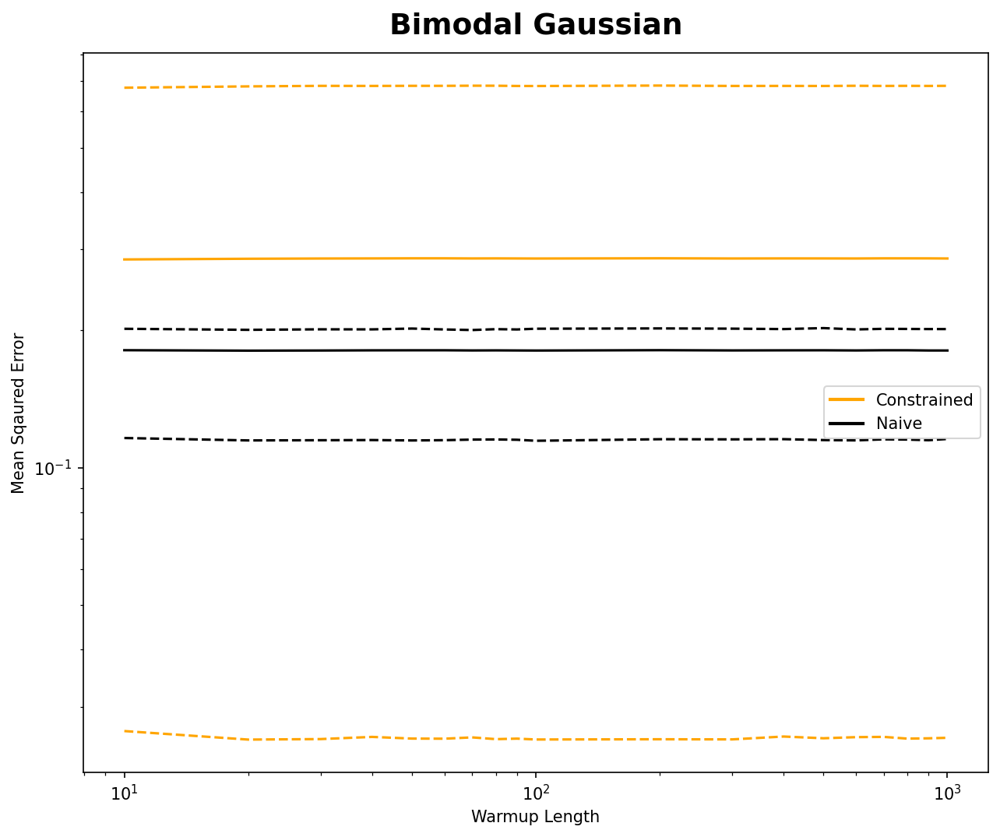

In [14]:
MSE_vs_Warmup(tfp_MSE_c_df, tfp_MSE_n_df, "Bimodal Gaussian")

*Original Paper: Scatter plot*

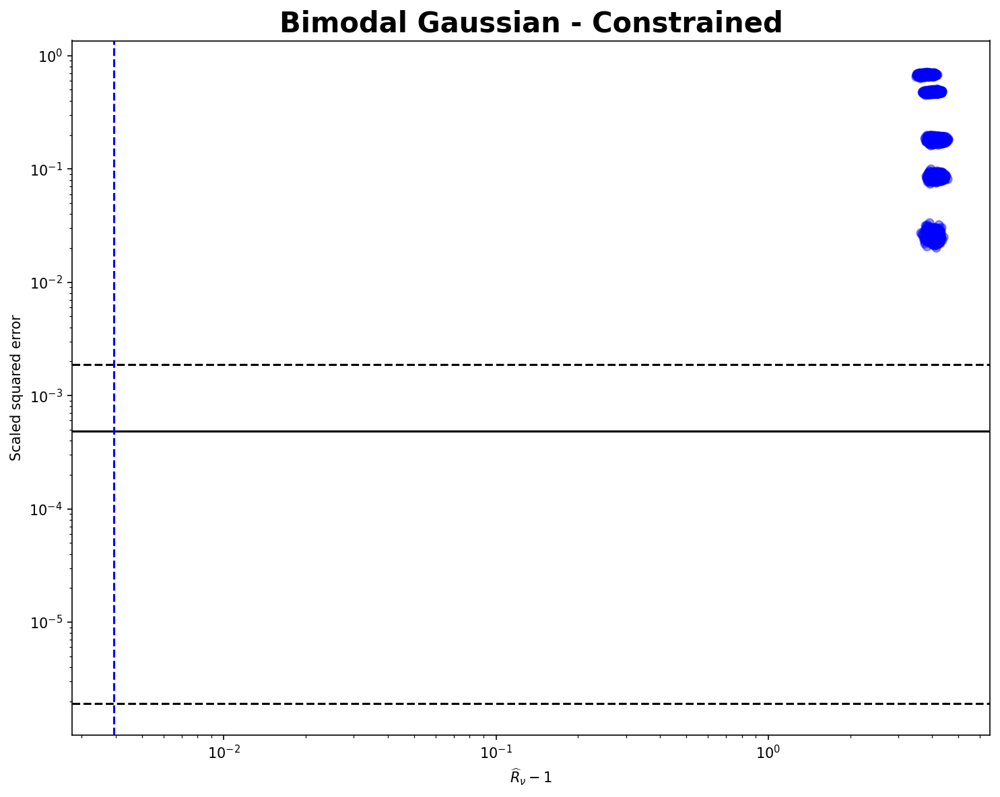

In [15]:
MSE_vs_Rhat(tfp_R_Hat_c_df, "Bimodal Gaussian", False, bound, threshold,num_chains_short)

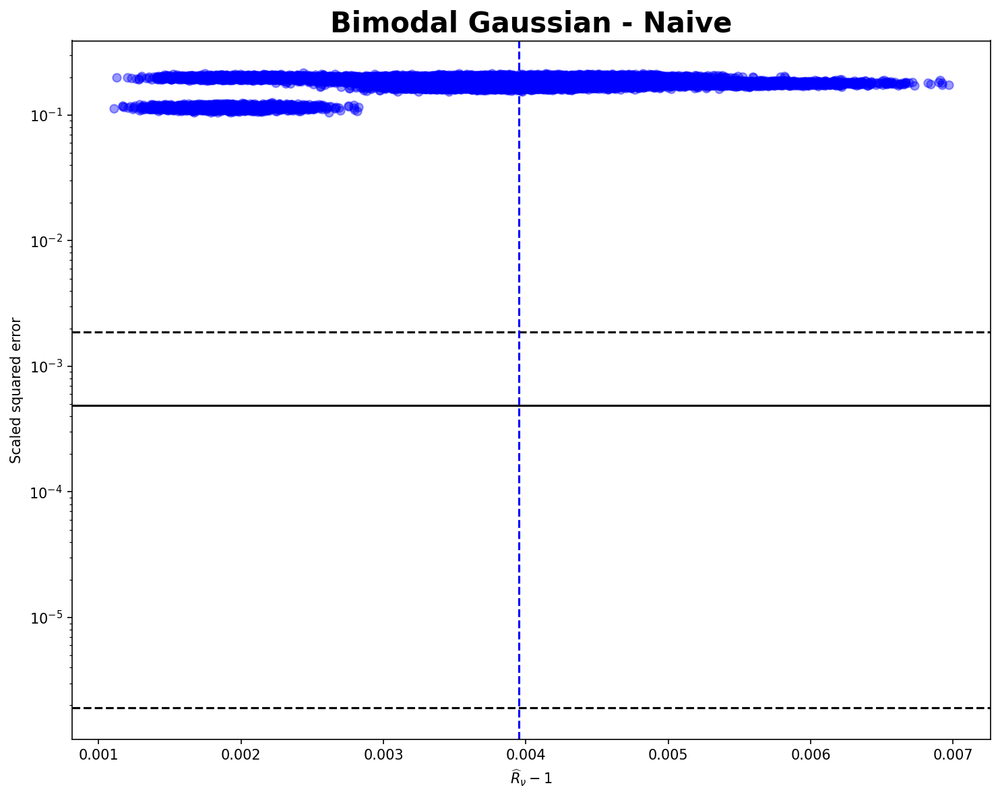

In [16]:
MSE_vs_Rhat(tfp_R_Hat_n_df, "Bimodal Gaussian", True, bound, threshold,num_chains_short)

*Enhanced Plots: multiple line plots*

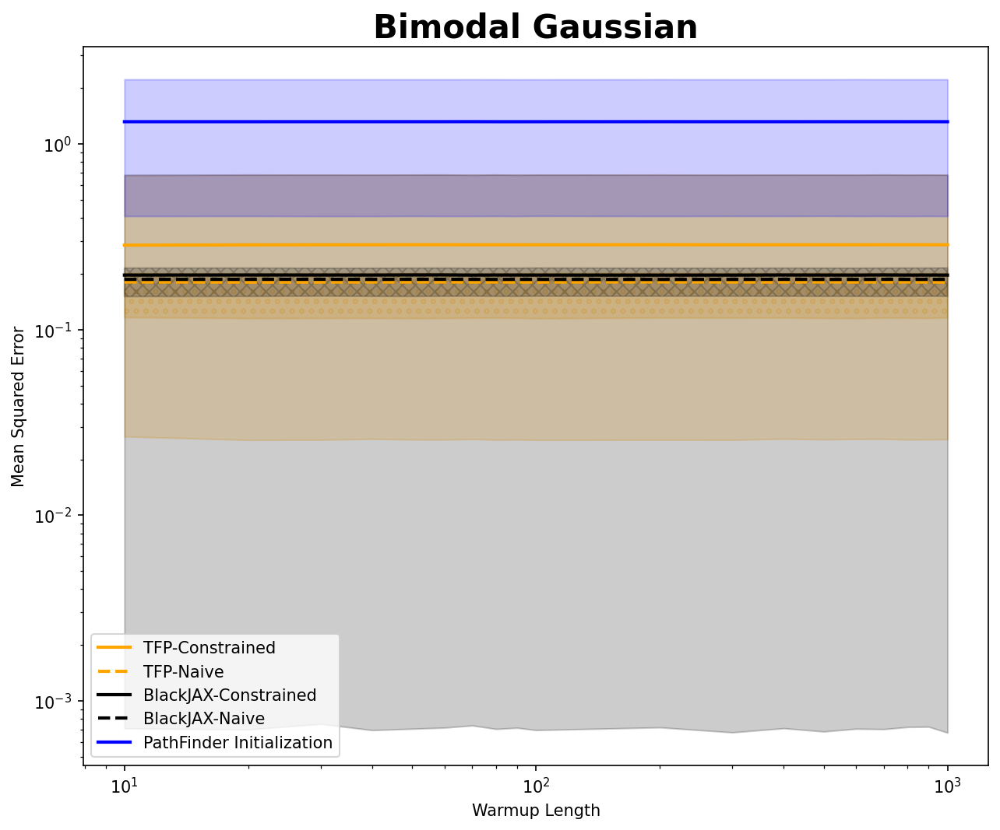

In [17]:
MSE_vs_Warmup_Jumbo(tfp_MSE_c_df, tfp_MSE_n_df,
                    bjx_MSE_c_df, bjx_MSE_n_df,
                    pf_MSE_df, "Bimodal Gaussian")

*Enhanced Plots: colored Scatter Plots*

In [18]:
dfs=[tfp_R_Hat_c_df, bjx_R_Hat_c_df, pf_R_Hat_df,
     tfp_R_Hat_n_df, bjx_R_Hat_n_df, pf_R_Hat_df]

titles =["TFP - Constrained","BlackJAX - Constrained","PathFinder",
         "TFP - Naive","BlackJAX - Naive","PathFinder"]

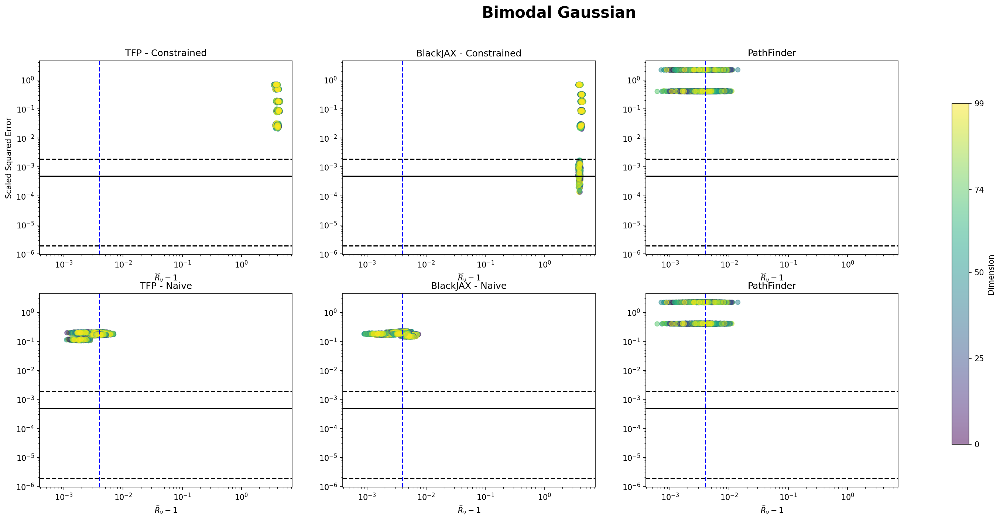

In [19]:
MSE_vs_Rhat_color(dfs,titles,"Bimodal Gaussian",bound,
                  threshold,num_chains_short,"Dimension")

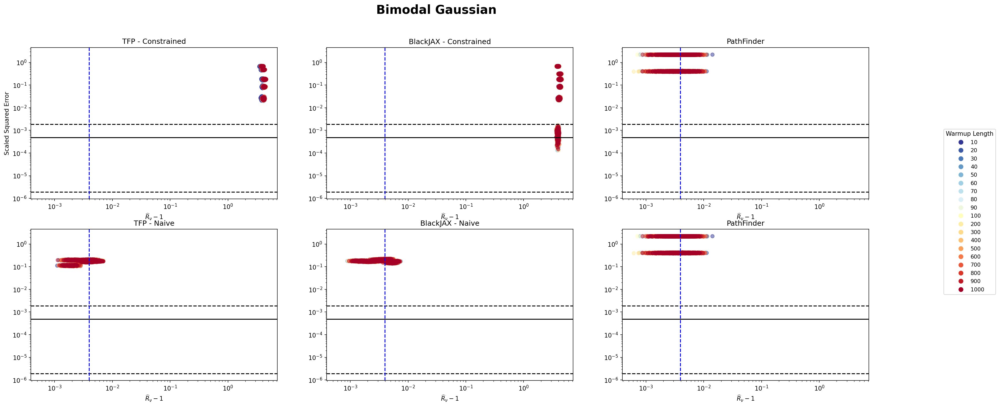

In [20]:
MSE_vs_Rhat_color(dfs, titles,"Bimodal Gaussian",bound, threshold,
                  num_chains_short,"Warmup Length")

**Eight Schools Example**

In [21]:
##########################
# TFP implementation:
##########################
# MSE vs Warmups:
tfp_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/School_MSE_constrained.pkl"
tfp_MSE_c_df = pd.read_pickle(tfp_MSE_c_path)

tfp_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/School_MSE_naive.pkl"
tfp_MSE_n_df = pd.read_pickle(tfp_MSE_n_path)
# MSE vs nested Rhat:
tfp_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/School_R_Hat_constrained.pkl"
tfp_R_Hat_c_df = pd.read_pickle(tfp_R_hat_c_path)

tfp_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/School_R_Hat_naive.pkl"
tfp_R_Hat_n_df = pd.read_pickle(tfp_R_hat_n_path)
print("TFP implementation data Loaded!")
##########################
# BlackJAX implementation:
##########################
# MSE vs Warmups:
bjx_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/School_MSE_constrained.pkl"
bjx_MSE_c_df = pd.read_pickle(bjx_MSE_c_path)

bjx_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/School_MSE_naive.pkl"
bjx_MSE_n_df = pd.read_pickle(bjx_MSE_n_path)
# MSE vs nested Rhat:
bjx_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/School_R_Hat_constrained.pkl"
bjx_R_Hat_c_df = pd.read_pickle(bjx_R_hat_c_path)

bjx_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/School_R_Hat_naive.pkl"
bjx_R_Hat_n_df = pd.read_pickle(bjx_R_hat_n_path)
print("BlackJAX implementation data Loaded!")
##########################
# BlackJAX implementation, with PathFinder Initialization:
##########################
# MSE vs Warmups:
pf_MSE_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/School_MSE.pkl"
pf_MSE_df = pd.read_pickle(pf_MSE_path)
# MSE vs nested Rhat:
pf_R_Hat_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/School_R_Hat.pkl"
pf_R_Hat_df = pd.read_pickle(pf_R_Hat_path)
print("PathFinder implementation data Loaded!")

TFP implementation data Loaded!
BlackJAX implementation data Loaded!
PathFinder implementation data Loaded!


*Original Paper: line plot*

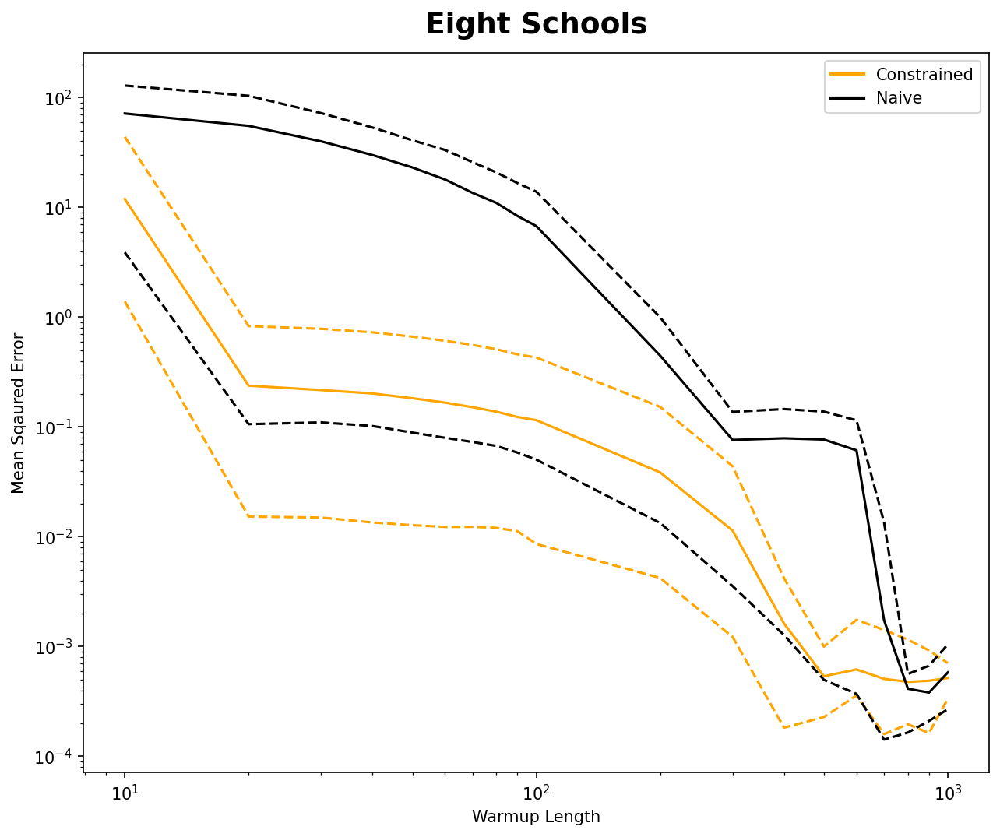

In [22]:
MSE_vs_Warmup(tfp_MSE_c_df, tfp_MSE_n_df, "Eight Schools")

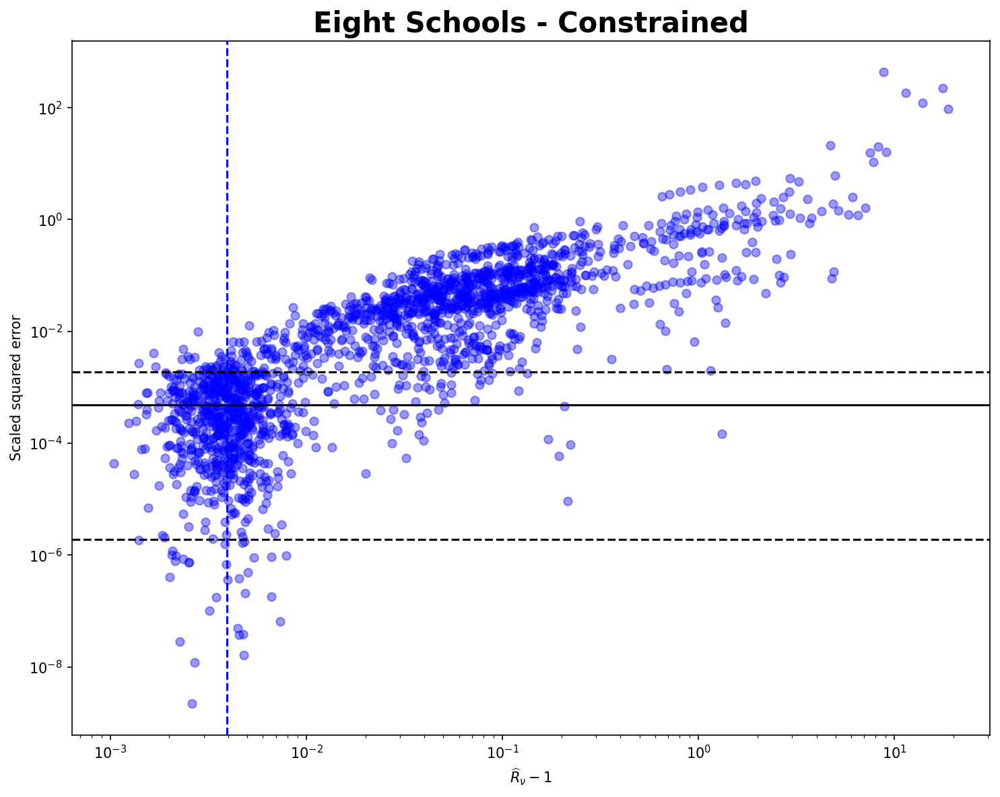

In [23]:
MSE_vs_Rhat(tfp_R_Hat_c_df, "Eight Schools", False, bound, threshold,num_chains_short)

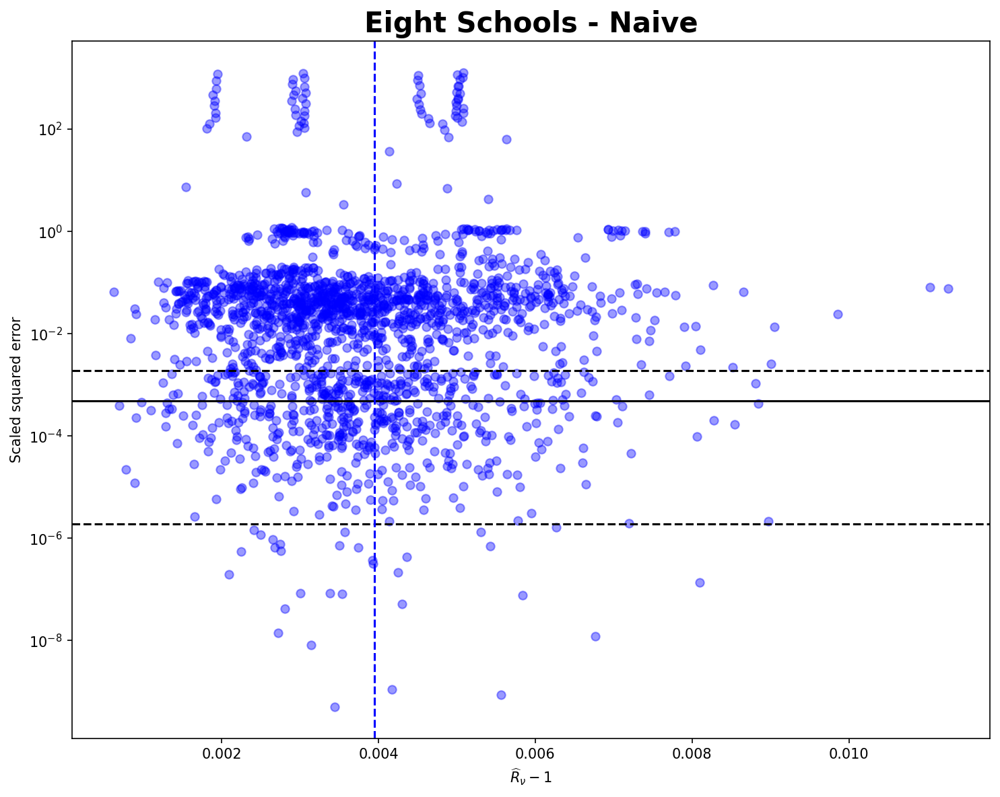

In [24]:
MSE_vs_Rhat(tfp_R_Hat_n_df, "Eight Schools", True, bound, threshold,num_chains_short)

*Enhanced Plots: multiple line plots*

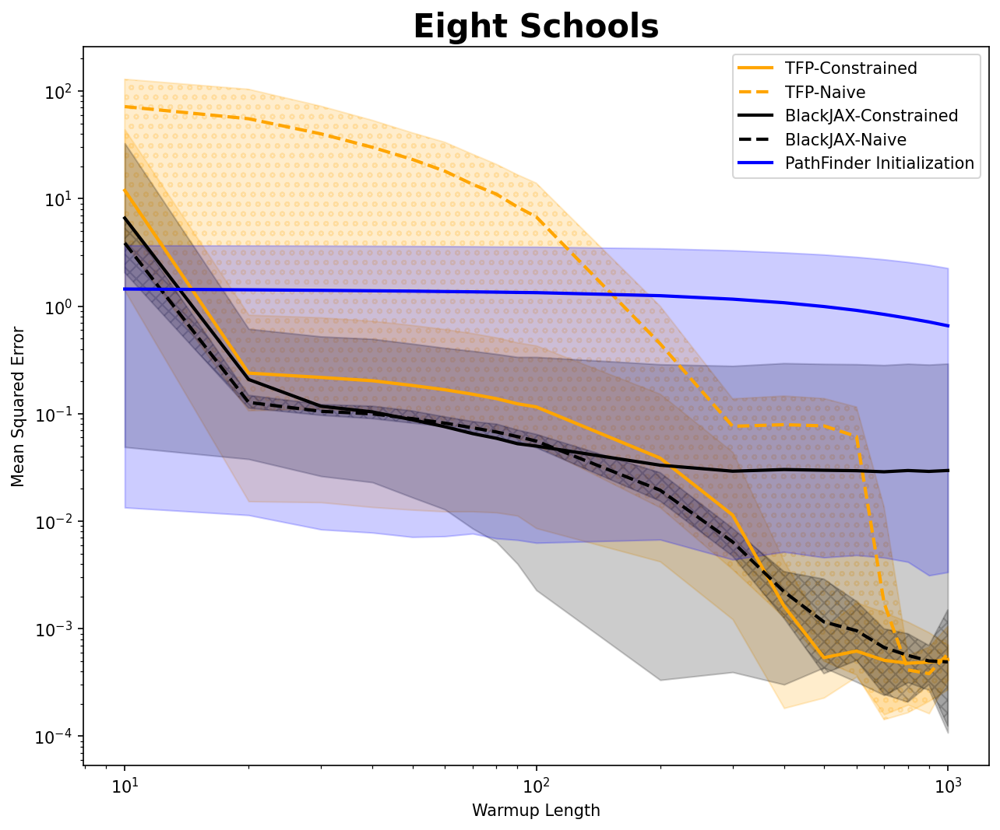

In [25]:
MSE_vs_Warmup_Jumbo(tfp_MSE_c_df, tfp_MSE_n_df,
                    bjx_MSE_c_df, bjx_MSE_n_df,
                    pf_MSE_df, "Eight Schools")

*Enhanced Plots: colored Scatter Plots*

In [26]:
dfs=[tfp_R_Hat_c_df, bjx_R_Hat_c_df, pf_R_Hat_df,
     tfp_R_Hat_n_df, bjx_R_Hat_n_df, pf_R_Hat_df]

titles =["TFP - Constrained","BlackJAX - Constrained","PathFinder",
         "TFP - Naive","BlackJAX - Naive","PathFinder"]

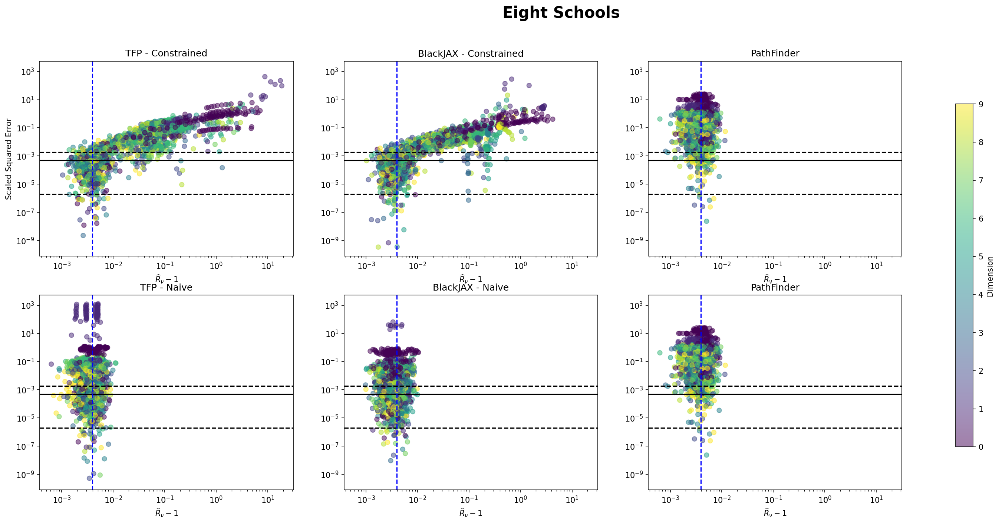

In [27]:
MSE_vs_Rhat_color(dfs, titles,"Eight Schools",bound,
                  threshold,num_chains_short,"Dimension")

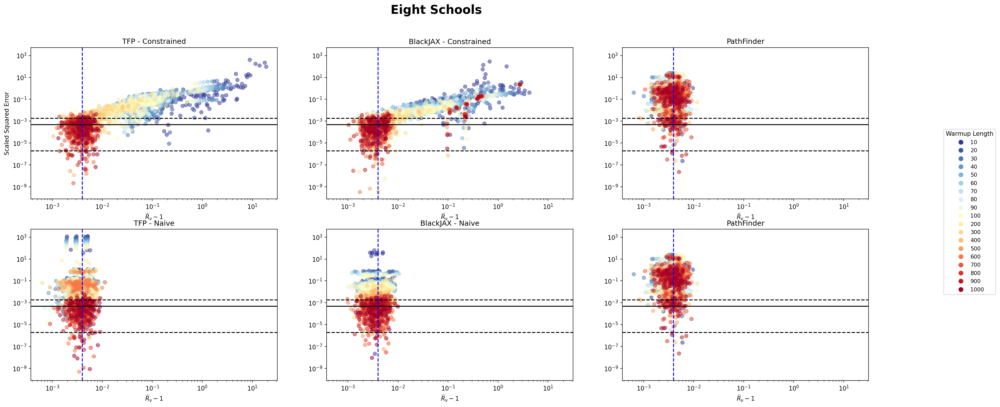

In [28]:
MSE_vs_Rhat_color(dfs, titles, "Eight Schools",bound,
                  threshold,num_chains_short,"Warmup Length")

**Item Response Theory Example**

In [29]:
##########################
# TFP implementation:
##########################
# MSE vs Warmups:
tfp_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/IRT_MSE_constrained.pkl"
tfp_MSE_c_df = pd.read_pickle(tfp_MSE_c_path)

tfp_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/IRT_MSE_naive.pkl"
tfp_MSE_n_df = pd.read_pickle(tfp_MSE_n_path)
# MSE vs nested Rhat:
tfp_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/IRT_R_Hat_constrained.pkl"
tfp_R_Hat_c_df = pd.read_pickle(tfp_R_hat_c_path)

tfp_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/pkl_files/IRT_R_Hat_naive.pkl"
tfp_R_Hat_n_df = pd.read_pickle(tfp_R_hat_n_path)
print("TFP implementation data Loaded!")
##########################
# BlackJAX implementation:
##########################
# MSE vs Warmups:
bjx_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/IRT_MSE_constrained.pkl"
bjx_MSE_c_df = pd.read_pickle(bjx_MSE_c_path)

bjx_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/IRT_MSE_naive.pkl"
bjx_MSE_n_df = pd.read_pickle(bjx_MSE_n_path)
# MSE vs nested Rhat:
bjx_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/IRT_R_Hat_constrained.pkl"
bjx_R_Hat_c_df = pd.read_pickle(bjx_R_hat_c_path)

bjx_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_pkl_files/IRT_R_Hat_naive.pkl"
bjx_R_Hat_n_df = pd.read_pickle(bjx_R_hat_n_path)
print("BlackJAX implementation data Loaded!")
##########################
# BlackJAX implementation, with PathFinder Initialization:
##########################
# MSE vs Warmups:
pf_MSE_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/IRT_MSE.pkl"
pf_MSE_df = pd.read_pickle(pf_MSE_path)
# MSE vs nested Rhat:
pf_R_Hat_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/BlackJAX_PF_pkl_files/IRT_R_Hat.pkl"
pf_R_Hat_df = pd.read_pickle(pf_R_Hat_path)
print("PathFinder implementation data Loaded!")

TFP implementation data Loaded!
BlackJAX implementation data Loaded!
PathFinder implementation data Loaded!


*Original Paper: line plot*

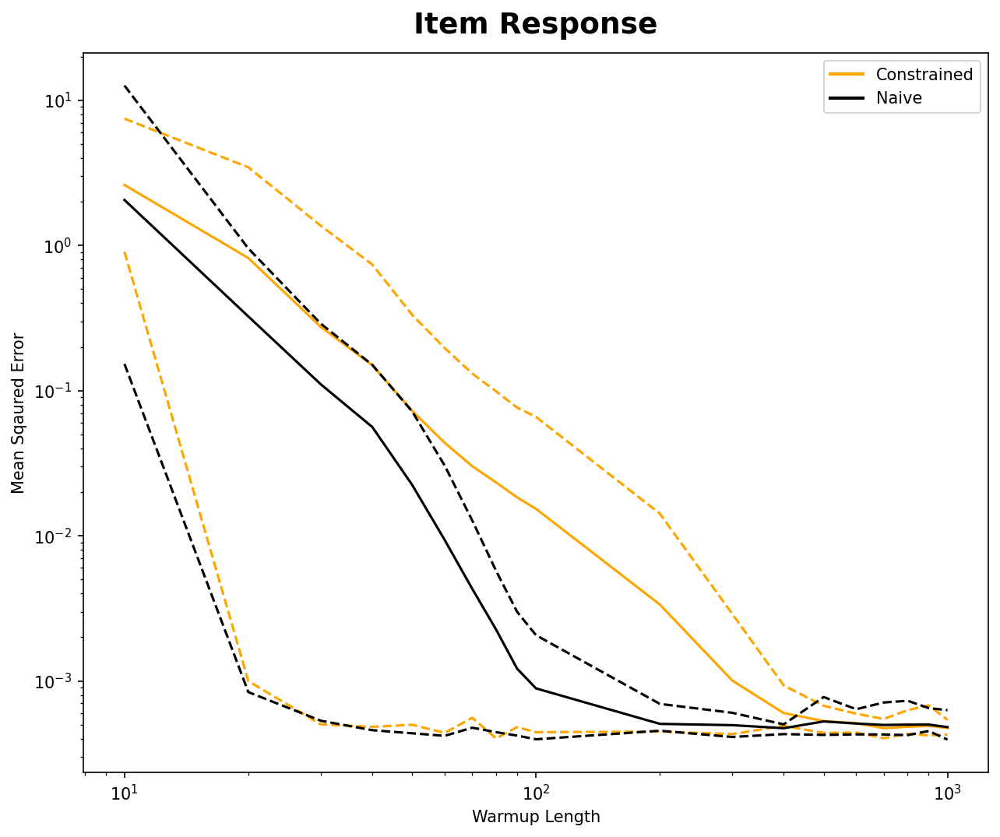

In [30]:
MSE_vs_Warmup(tfp_MSE_c_df, tfp_MSE_n_df, "Item Response")

*Original Paper: Scatter plot*

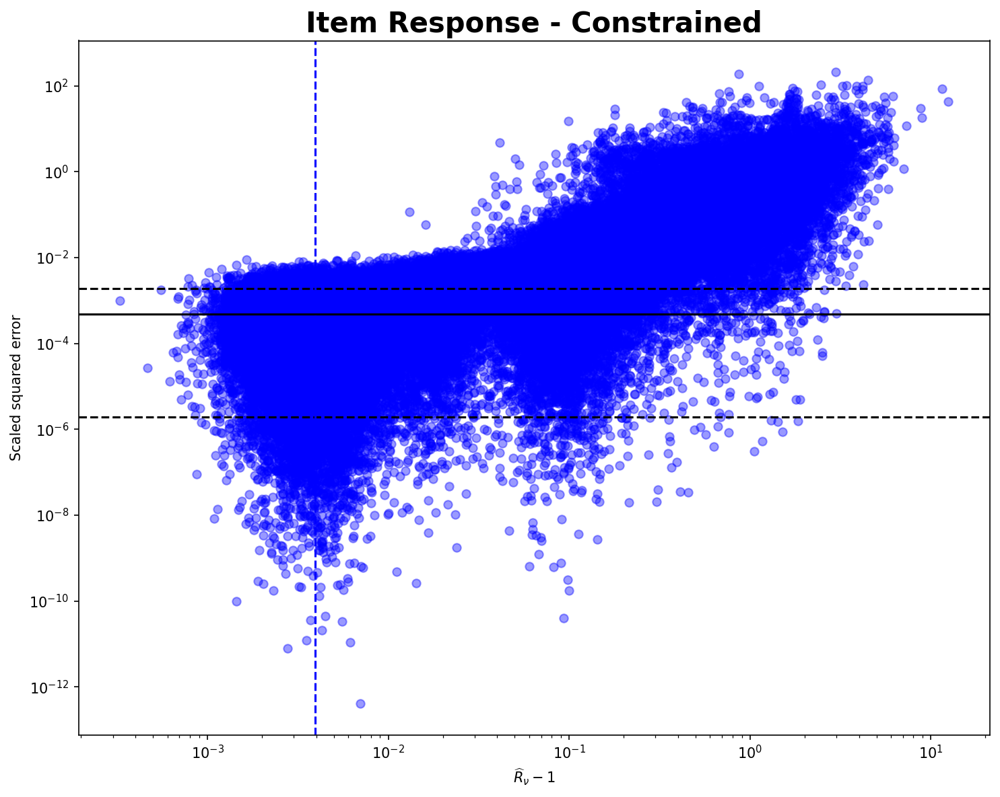

In [31]:
MSE_vs_Rhat(tfp_R_Hat_c_df, "Item Response", False, bound, threshold,num_chains_short)

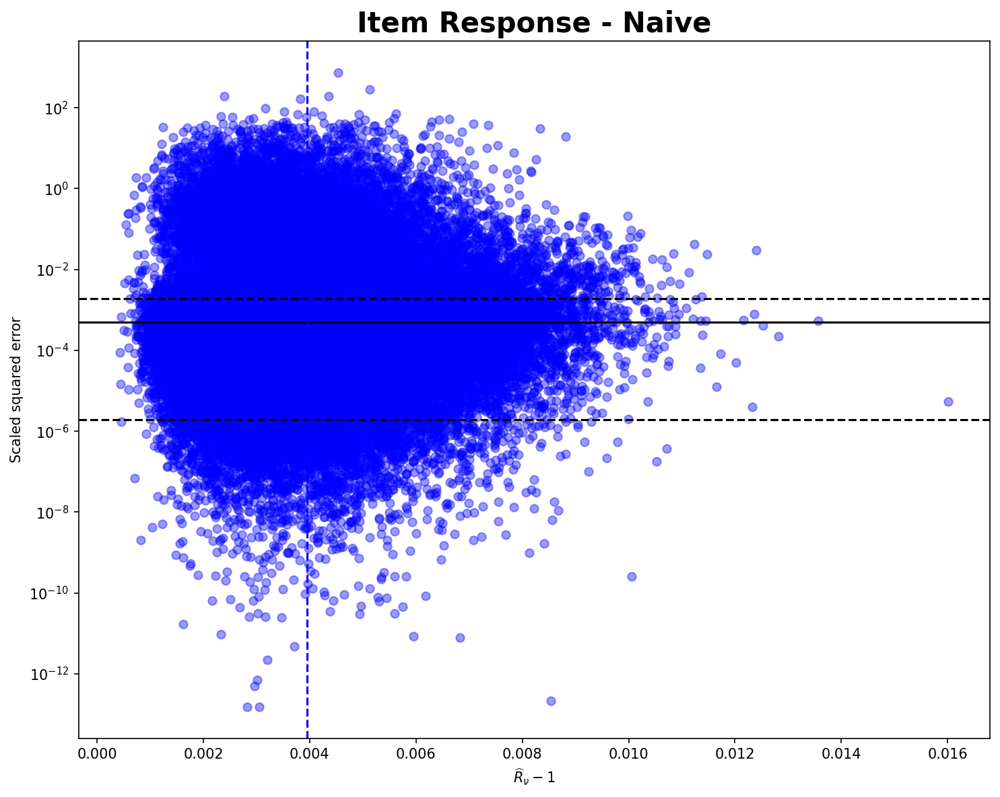

In [32]:
MSE_vs_Rhat(tfp_R_Hat_n_df, "Item Response", True, bound, threshold,num_chains_short)

*Enhanced Plots: multiple line plots*

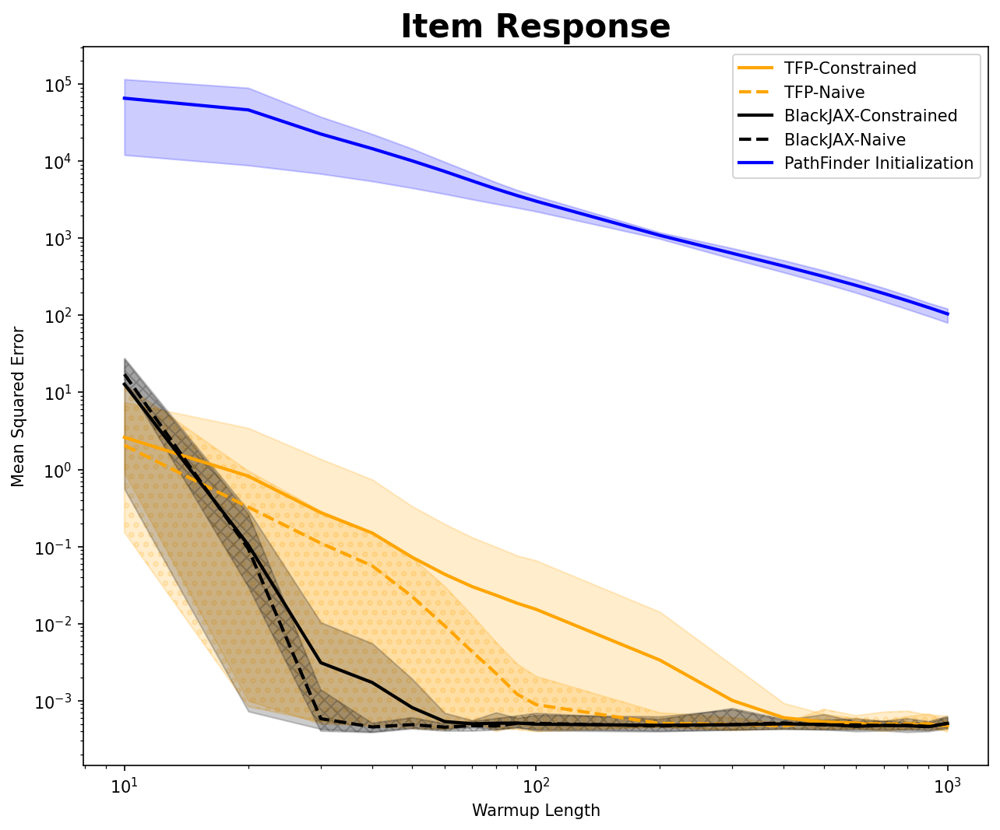

In [33]:
MSE_vs_Warmup_Jumbo(tfp_MSE_c_df, tfp_MSE_n_df,
                    bjx_MSE_c_df, bjx_MSE_n_df,
                    pf_MSE_df, "Item Response")

*Enhanced Plots: colored Scatter Plots*

In [34]:
dfs=[tfp_R_Hat_c_df, bjx_R_Hat_c_df, pf_R_Hat_df,
     tfp_R_Hat_n_df, bjx_R_Hat_n_df, pf_R_Hat_df]

titles =["TFP - Constrained","BlackJAX - Constrained","PathFinder",
         "TFP - Naive","BlackJAX - Naive","PathFinder"]

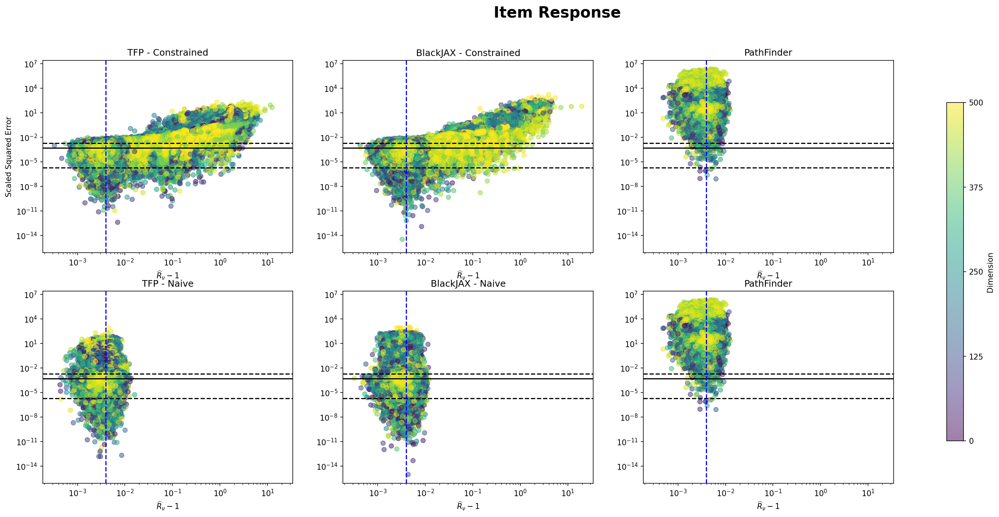

In [35]:
MSE_vs_Rhat_color(dfs,titles,"Item Response",bound,
                  threshold,num_chains_short,"Dimension")

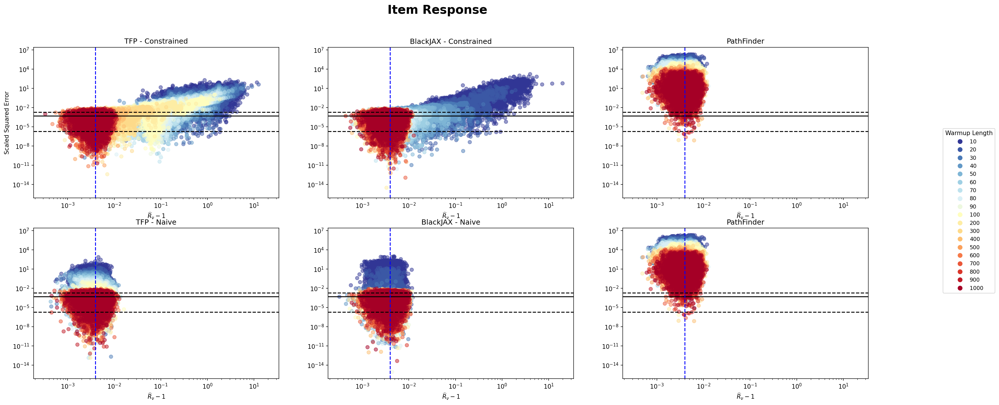

In [36]:
MSE_vs_Rhat_color(dfs, titles,"Item Response",bound,
                  threshold,num_chains_short,"Warmup Length")

**Additional Experiments**

**MVN-Isotropic Covariance**

In [37]:
##########################
# TFP implementation:
##########################
# MSE vs Warmups:
tfp_Iso_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_Iso_MSE_c.pkl"
tfp_Iso_MSE_c_df = pd.read_pickle(tfp_Iso_MSE_c_path)

tfp_Iso_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_Iso_MSE_n.pkl"
tfp_Iso_MSE_n_df = pd.read_pickle(tfp_Iso_MSE_n_path)
# MSE vs nested Rhat:
tfp_Iso_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_Iso_Rhat_c.pkl"
tfp_Iso_R_Hat_c_df = pd.read_pickle(tfp_Iso_R_hat_c_path)

tfp_Iso_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_Iso_Rhat_n.pkl"
tfp_Iso_R_Hat_n_df = pd.read_pickle(tfp_Iso_R_hat_n_path)
print("TFP implementation data Loaded!")
##########################
# BlackJAX implementation:
##########################
# MSE vs Warmups:
BJX_Iso_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/Iso_MSE_c.pkl"
BJX_Iso_MSE_c_df = pd.read_pickle(BJX_Iso_MSE_c_path)

BJX_Iso_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/Iso_MSE_n.pkl"
BJX_Iso_MSE_n_df = pd.read_pickle(BJX_Iso_MSE_n_path)

# MSE vs nested Rhat:
BJX_Iso_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/Iso_Rhat_c.pkl"
BJX_Iso_R_Hat_c_df = pd.read_pickle(BJX_Iso_R_hat_c_path)

BJX_Iso_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/Iso_Rhat_n.pkl"
BJX_Iso_R_Hat_n_df = pd.read_pickle(BJX_Iso_R_hat_n_path)
print("BlackJAX implementation data Loaded!")
##########################
# BlackJAX implementation, with PathFinder Initialization:
##########################
# MSE vs Warmups:
pf_MSE_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/PF_Iso_MSE.pkl"
pf_MSE_df = pd.read_pickle(pf_MSE_path)
# MSE vs nested Rhat:
pf_R_Hat_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/PF_Iso_Rhat.pkl"
pf_R_Hat_df = pd.read_pickle(pf_R_Hat_path)
print("PathFinder implementation data Loaded!")

TFP implementation data Loaded!
BlackJAX implementation data Loaded!
PathFinder implementation data Loaded!


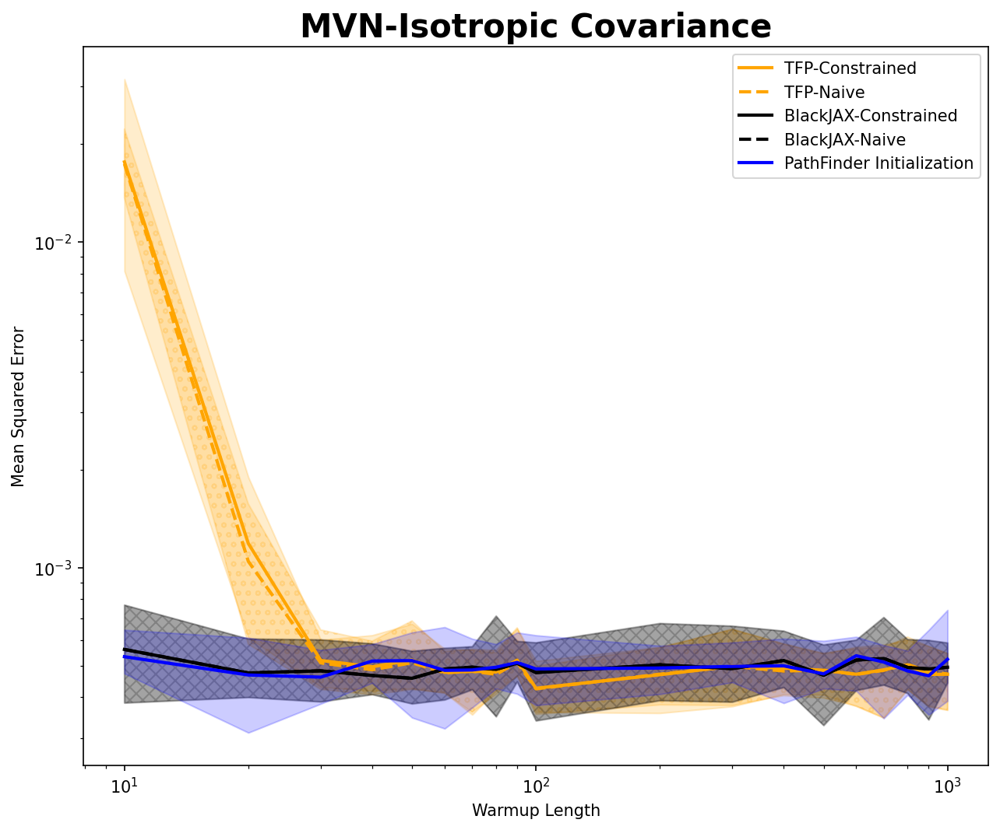

In [38]:
MSE_vs_Warmup_Jumbo(tfp_Iso_MSE_c_df, tfp_Iso_MSE_n_df,
                    BJX_Iso_MSE_c_df, BJX_Iso_MSE_c_df,
                    pf_MSE_df, "MVN-Isotropic Covariance")

In [39]:
dfs=[tfp_Iso_R_Hat_c_df, BJX_Iso_R_Hat_c_df, pf_R_Hat_df,
     tfp_Iso_R_Hat_n_df, BJX_Iso_R_Hat_n_df, pf_R_Hat_df]

titles =["TFP - Constrained","BlackJAX - Constrained","PathFinder",
         "TFP - Naive","BlackJAX - Naive","PathFinder"]

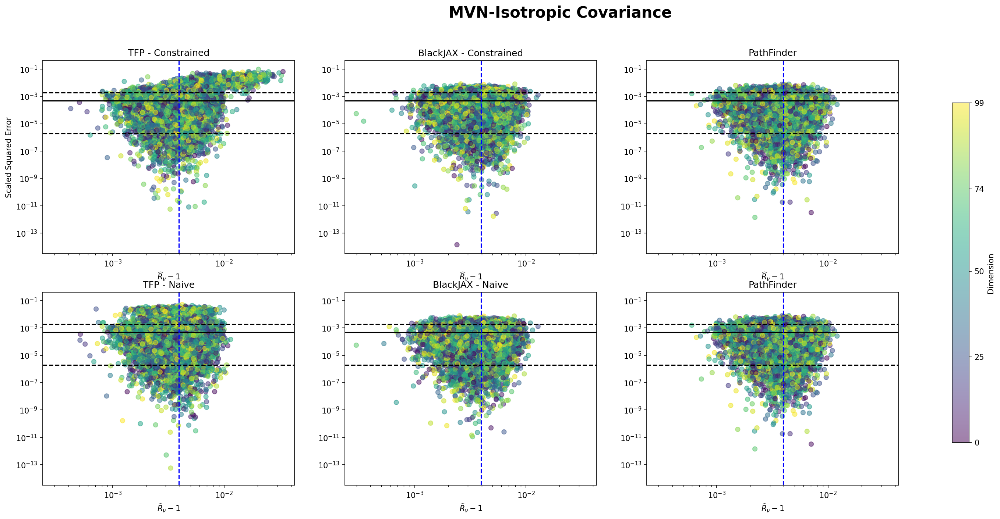

In [40]:
MSE_vs_Rhat_color(dfs, titles,"MVN-Isotropic Covariance",bound,
                  threshold,num_chains_short,"Dimension")

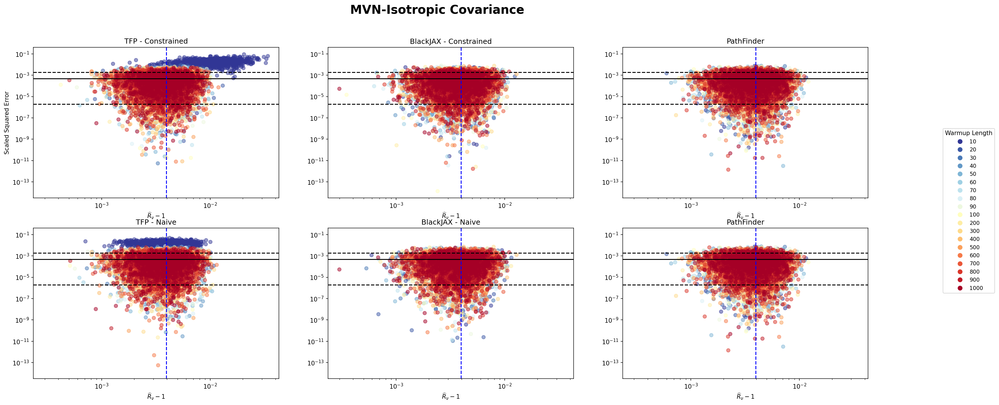

In [41]:
MSE_vs_Rhat_color(dfs, titles,"MVN-Isotropic Covariance",bound,
                  threshold,num_chains_short,"Warmup Length")

**MVN-AR(1) Covariance**

In [42]:
##########################
# TFP implementation:
##########################
# MSE vs Warmups:
tfp_AR_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_AR_MSE_c.pkl"
tfp_AR_MSE_c_df = pd.read_pickle(tfp_AR_MSE_c_path)

tfp_AR_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_AR_MSE_n.pkl"
tfp_AR_MSE_n_df = pd.read_pickle(tfp_AR_MSE_n_path)
# MSE vs nested Rhat:
tfp_AR_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_AR_Rhat_c.pkl"
tfp_AR_R_Hat_c_df = pd.read_pickle(tfp_AR_R_hat_c_path)

tfp_AR_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/TFP_AR_Rhat_n.pkl"
tfp_AR_R_Hat_n_df = pd.read_pickle(tfp_AR_R_hat_n_path)
print("TFP implementation data Loaded!")
##########################
# BlackJAX implementation:
##########################
# MSE vs Warmups:
BJX_AR_MSE_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/AR_MSE_c.pkl"
BJX_AR_MSE_c_df = pd.read_pickle(BJX_AR_MSE_c_path)

BJX_AR_MSE_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/AR_MSE_n.pkl"
BJX_AR_MSE_n_df = pd.read_pickle(BJX_AR_MSE_n_path)

# MSE vs nested Rhat:
BJX_AR_R_hat_c_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/AR_Rhat_c.pkl"
BJX_AR_R_Hat_c_df = pd.read_pickle(BJX_AR_R_hat_c_path)

BJX_AR_R_hat_n_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/AR_Rhat_n.pkl"
BJX_AR_R_Hat_n_df = pd.read_pickle(BJX_AR_R_hat_n_path)
print("BlackJAX implementation data Loaded!")
##########################
# BlackJAX implementation, with PathFinder Initialization:
##########################
# MSE vs Warmups:
pf_MSE_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/PF_AR_MSE.pkl"
pf_MSE_df = pd.read_pickle(pf_MSE_path)
# MSE vs nested Rhat:
pf_R_Hat_path = "/content/drive/MyDrive/Colab Notebooks/2026_Summer_MCMC/MVN_pkl_files/PF_AR_Rhat.pkl"
pf_R_Hat_df = pd.read_pickle(pf_R_Hat_path)
print("PathFinder implementation data Loaded!")

TFP implementation data Loaded!
BlackJAX implementation data Loaded!
PathFinder implementation data Loaded!


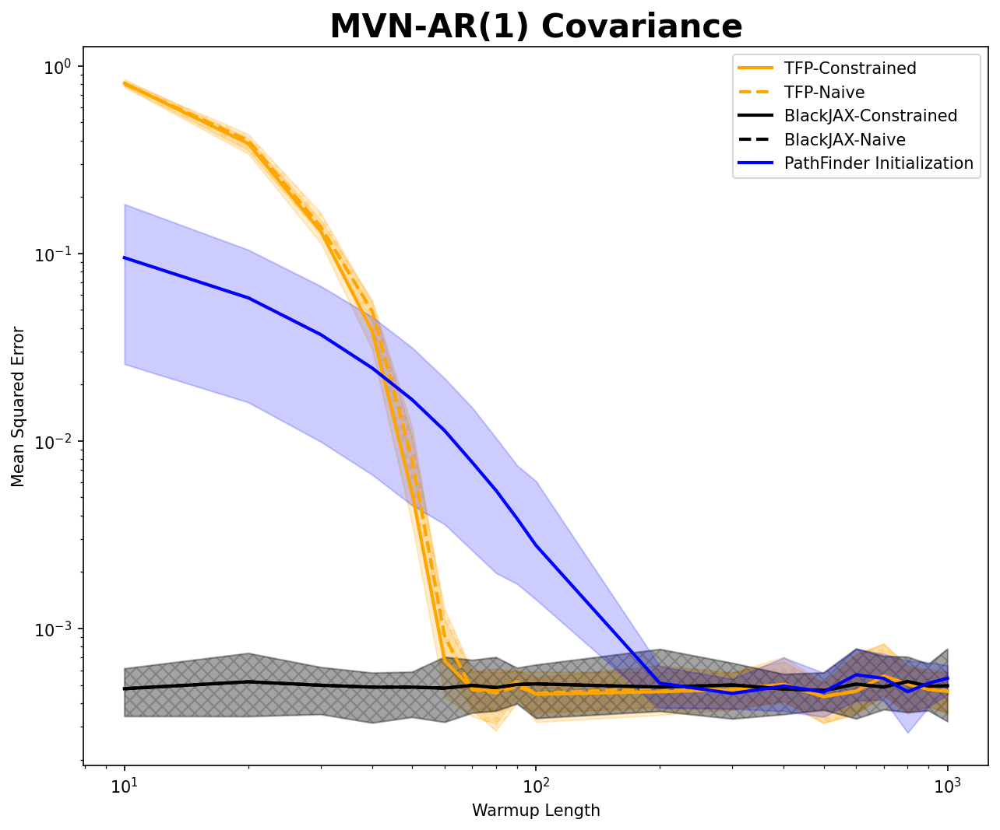

In [43]:
MSE_vs_Warmup_Jumbo(tfp_AR_MSE_c_df, tfp_AR_MSE_n_df,
                    BJX_AR_MSE_c_df, BJX_AR_MSE_c_df,
                    pf_MSE_df, "MVN-AR(1) Covariance")

In [44]:
dfs=[tfp_AR_R_Hat_c_df, BJX_AR_R_Hat_c_df, pf_R_Hat_df,
     tfp_AR_R_Hat_n_df, BJX_AR_R_Hat_n_df, pf_R_Hat_df]

titles =["TFP - Constrained","BlackJAX - Constrained","PathFinder",
         "TFP - Naive","BlackJAX - Naive","PathFinder"]

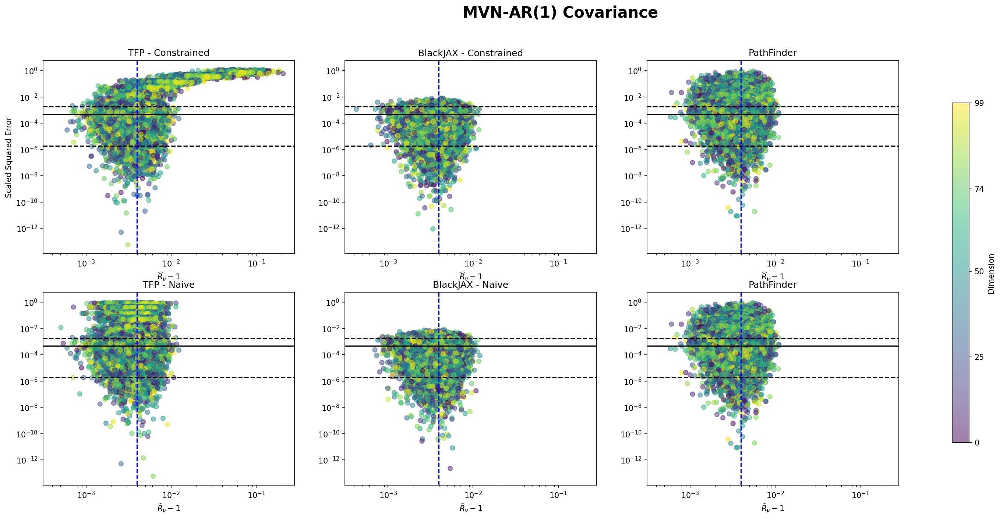

In [45]:
MSE_vs_Rhat_color(dfs, titles,"MVN-AR(1) Covariance",bound,
                  threshold,num_chains_short,"Dimension")

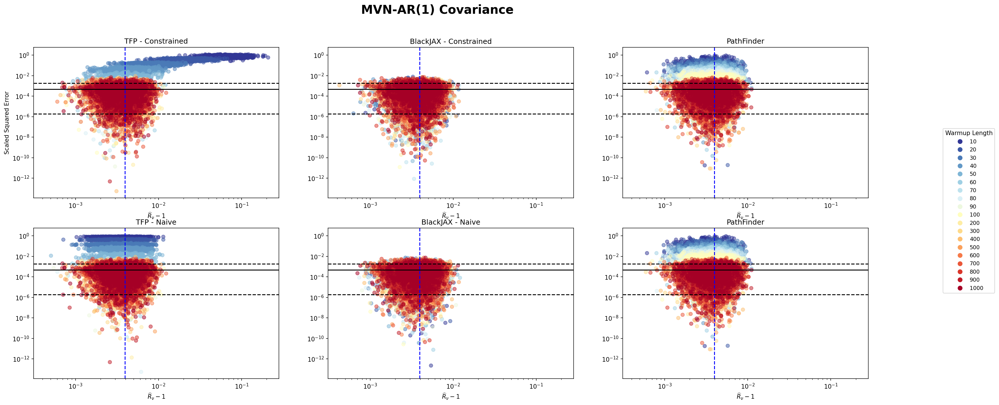

In [46]:
MSE_vs_Rhat_color(dfs, titles, "MVN-AR(1) Covariance",bound,
                  threshold,num_chains_short,"Warmup Length")